## Part 2 - Blob detection
#### *Pol Roca Llaberia*


### Laplacian of Gaussian vs Difference of Gaussian vs Determinant of Hessian

The **LoG** is by theory the most accurate approach used to detect blobs because it computes the second derivative to detect important contrast changes, which is a consistent indicator. However, computing these second derivaties is costly. **DoG** is another approach that attemps to solve that problem by approximating the laplacian of a gaussian. This method filters the same image using gaussian filters with different sigmas, and then subtracts consecutive smoothed images in pairs which results into activation maps that are very similar to those obtained by applying a LoG filter. Many different sigmas are used (grouped in octaves) in order to find local scale-space extrema, which are points where the activation is maximized across all scales.

Finally, **DoH** takes a different approach from theory and employs the Hessian matrix to detect blobs. This is the fastest approach and it is said to be more robust to affine transformations. Although, it has the drawback of being less sensitive to small-sized blobs.

In this notebook we will perform a comparison of these three methods by applying them in several general purpose images and observing how they behave on distorted images.

In [3]:
from matplotlib import pyplot as plt
import numpy as np

from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.transform import warp, AffineTransform, EuclideanTransform
from skimage.color import rgb2gray

In [4]:
def plot_blob_comparison(img, ax):
    img = rgb2gray(img) if img.ndim > 2 else img

    # LoG (Laplacian of Gaussian)
    blobs_log = blob_log(img, max_sigma=30, num_sigma=10, threshold=.1)    
    blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)  # compute radii in the 3rd column

    # DoG (Difference of Gaussian)
    blobs_dog = blob_dog(img, max_sigma=30, threshold=.1)
    blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

    # DoH (Determinant of Hessian)
    blobs_doh = blob_doh(img, max_sigma=30, threshold=.005)

    blobs_list = [blobs_log, blobs_dog, blobs_doh]
    colors = ['orange', 'lime', 'red']
    titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
            'Determinant of Hessian']
    sequence = zip(blobs_list, colors, titles)

    for idx, (blobs, color, title) in enumerate(sequence):
        ax[idx].set_title(title)
        ax[idx].imshow(img, cmap='gray')
        for blob in blobs:
            y, x, r = blob
            c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
            ax[idx].add_patch(c)
        ax[idx].set_axis_off()

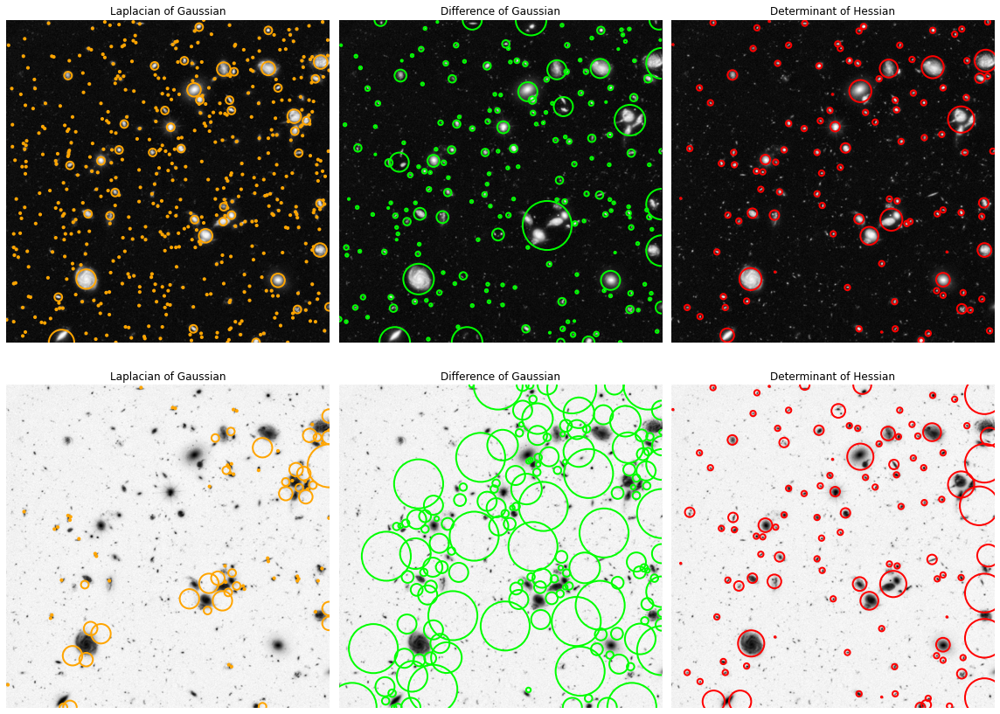

In [3]:
img = data.hubble_deep_field()[0:500, 0:500]
img = rgb2gray(img)

fig, axes = plt.subplots(2, 3, figsize=(16, 12), sharex=True, sharey=True)
plot_blob_comparison(img, axes[0])
plot_blob_comparison(1 - img, axes[1])

plt.tight_layout()
plt.show()

First we will see some practical issues of each method. In this plot, we can see each method applied to the same image, and also on the inverted image. 

In the normal image, from more to less, LoG is the most sensitive to small blobs, then DoG and finally DoH. LoG is in general more sensitive so smaller blobs, at the cost of being slower. DoG is faster but it tends to prefer larger blobs, grouping artifacts in a single blob. DoH does not have this issue, but it is the least sensitive to smaller blobs. Nonetheless, it is the fastest algorithm. 

Finally, there is a subtle issue related to detecting blobs depending on the intensity of the contrast change. This issue is reflected in the second row of the plot, where the image is inverted and the three methods must look for dark blobs in a light background instead. As we see, this condition interferes by much to the first two methods whose solution is totally different and probably not the preferred one. On the contrary, this shift in contrast does not affect DoH at all, which is something remarkable.

Let's see the behaviour in different general purpose images. With these comparisons we want to analyze the quality of the proposed blobs from the different algorithms. Since all of them are invariant to translation, scale, illumination and rotation, we will instead apply some affine transformations as in this case they are supposed to interfere with the detection. We will apply shears of 30º, 45º and 60º.

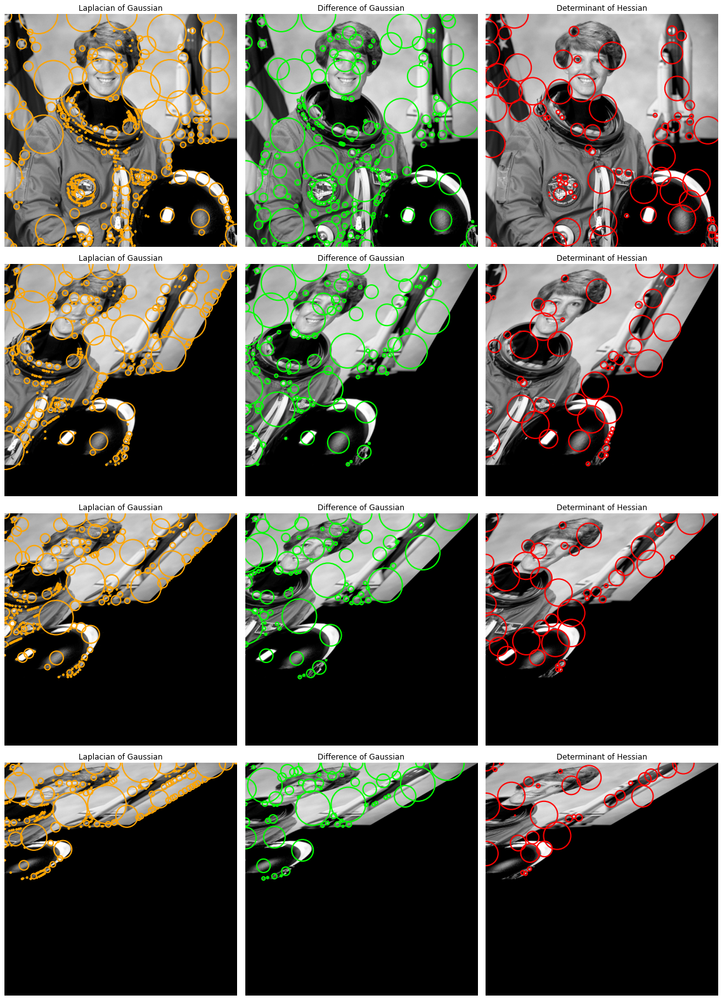

In [4]:
fig, axes = plt.subplots(4, 3, figsize=(16, 22), sharex=True, sharey=True)
img = rgb2gray(data.astronaut())

shears = (0, np.pi/6, np.pi/4, np.pi/3) # 30º, 45º, 60º
for ax, shear in zip(axes, shears):
    tform = AffineTransform(shear=shear)
    tf_img = warp(img, tform.inverse)
    plot_blob_comparison(tf_img, ax)

plt.tight_layout()
plt.show()

In this first case, without considering the distorted images, we could say that DoH has produced the most valuable blobs. The reason to that is that while the first two methods find lots of keypoints, these have some particular problems such as being too small (too much local) and focusing on the background or plain regions (normally they are not unique patterns). We can see that DoH does not have almost any of these issues.

Considering the shear, all of them seem to tolerate well the distortion as they are able to detect blobs on each level. However, the important part is repeatability: the same blobs should be found on each image. 
- LoG: In this case, we can see LoG has detected some blobs that are persistent across the distorted images (even the 60º), such as the one that takes the tip of the wing of the spaceship and part of her jacket, and the one on the tip of the rightmost propeller.
- DoG: It seems to also have found the same blob as the first we mentioned in LoG, and some on the helmet or the stars of the American flag have made it through all the distortions.
- DoH: By far the best result, we can see plenty of blobs such as the ones on her face, neck, tracksuit, helmet and some parts of the spaceship; they all have been found across all distortions. Also most importantly: they are all unique enough to prevent mismatches in future applications, in contrast to all the tiny blobs proposed by the other two methods, which we have ignored for that reason.

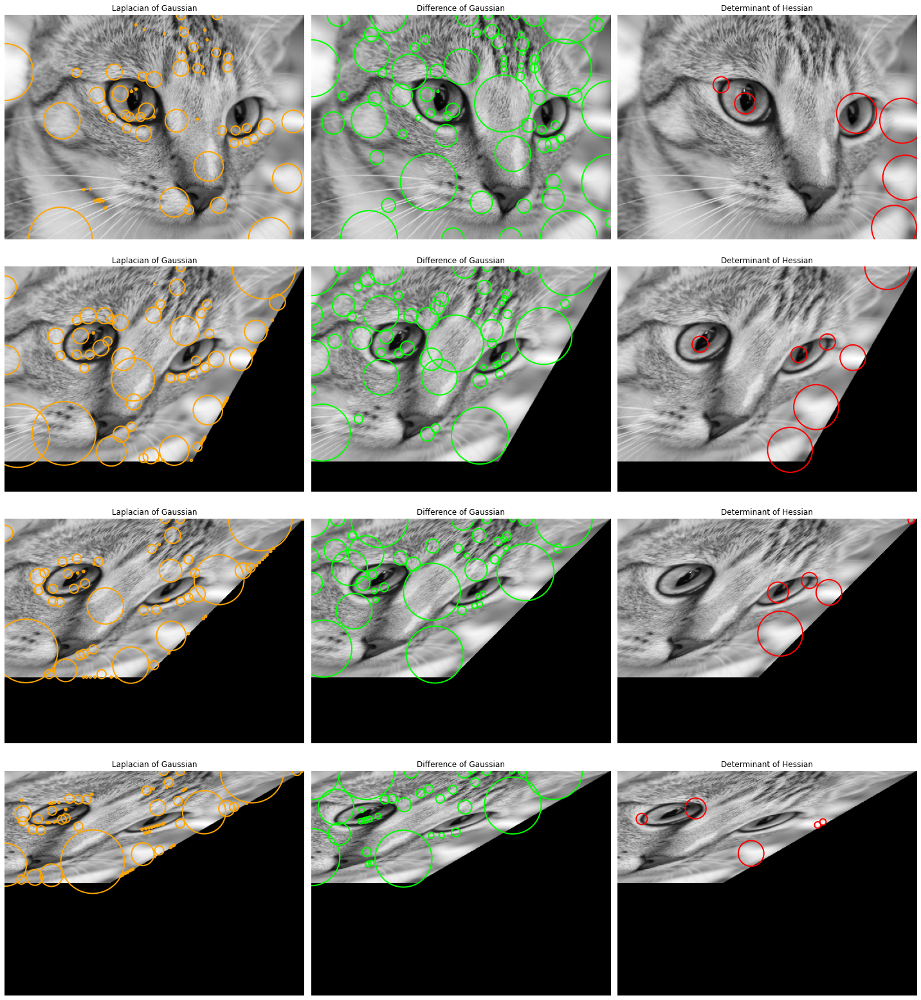

In [5]:
fig, axes = plt.subplots(4, 3, figsize=(20, 22), sharex=True, sharey=True)
img = rgb2gray(data.cat())[:, :400]

shears = (0, np.pi/6, np.pi/4, np.pi/3) # 30º, 45º, 60º
for ax, shear in zip(axes, shears):
    tform = AffineTransform(shear=shear)
    tf_img = warp(img, tform.inverse)
    plot_blob_comparison(tf_img, ax)

plt.tight_layout()
plt.show()

In this image of a close portrait of a cat we can see how LoG and DoG have found consistent blobs through the first two distortions, and with less frequence on the last one (which is normal, since it is very distorted). Noticeably, DoH has not been able to find many blobs in general, and only 1 can be found in all cases (on the blurred background). The problem with DoH has been the unability to detect important regions in the first place, since even in the original image few blobs have been found. This could be because of the texture of the fur of the cat that is interpreted quite differently from one method to the other (LoG and DoG are rather similar approaches).

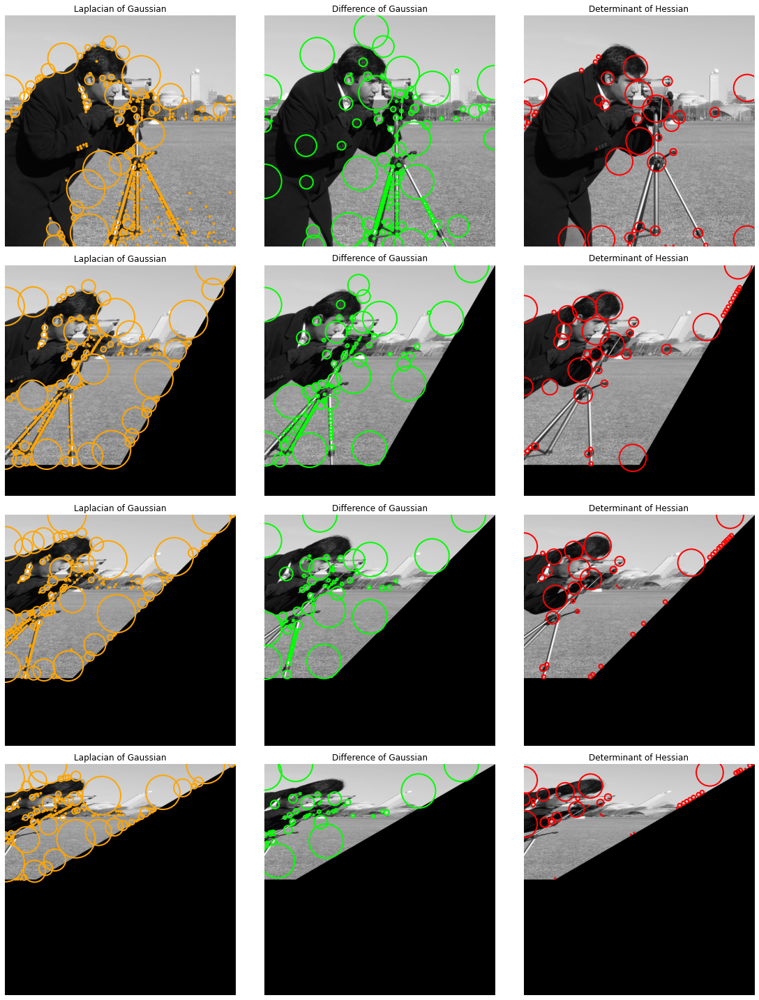

In [6]:
fig, axes = plt.subplots(4, 3, figsize=(16, 20), sharex=True, sharey=True)
img = rgb2gray(data.camera())

shears = (0, np.pi/6, np.pi/4, np.pi/3)
for ax, shear in zip(axes, shears):
    tform = AffineTransform(shear=shear)
    tf_img = warp(img, tform.inverse)
    plot_blob_comparison(tf_img, ax)

plt.tight_layout()
plt.show()

In this typical image of the cameraman we can see that all three methods have found some reliable blobs. Considering that the last image is always a truly distorted image very far from the original, the algorithms seem to have managed to find equivalent blobs in the other transformed images properly, and even some in that last one. 

In general DoH is probably the one that found the best quality blobs in the original and distorted images. If we take a closer look, we can see that in fact it is the only one that has been capable of detecting some particular blobs, such as the ones on the hair, and this could be because they are dark-on-light blobs.

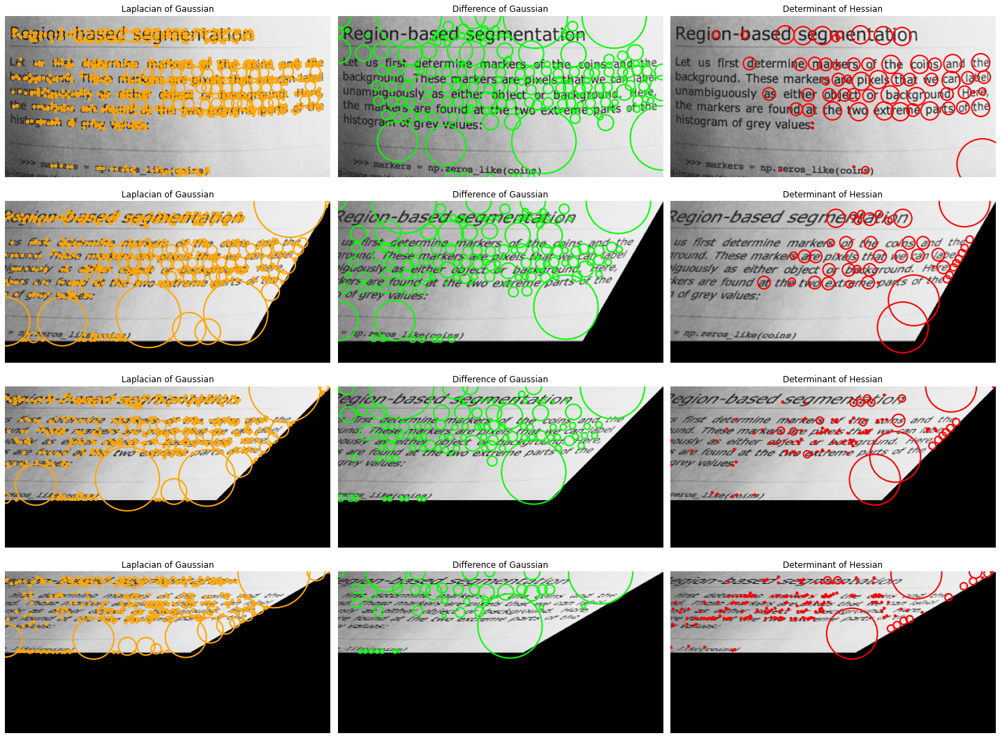

In [5]:
fig, axes = plt.subplots(4, 3, figsize=(20, 15), sharex=True, sharey=True)
img = rgb2gray(data.page())

shears = (0, np.pi/6, np.pi/4, np.pi/3)
for ax, shear in zip(axes, shears):
    tform = AffineTransform(shear=shear)
    tf_img = warp(img, tform.inverse)
    plot_blob_comparison(tf_img, ax)

plt.tight_layout()
plt.show()

This is a clear example that denotes the ability for DoH to detect dark blobs on a light background. This image of a segment of text is a prove that this feature is actually relevant, since in many images that contain text it is common to see that the font appears darker on a lighter background, so that there is plenty of cases where DoH could have an advantage. 

Now looking at the original images, we can just see how DoH is the only method effectively detecting blobs from text. Besides, we also see how after applying the homography not many of them *survive*. 

Another case is that of DoG, which even though it fails at detecting blobs from text, it still manages to find keypoints between the lines. However, although we must say many of these blobs have made it through all the transformations, we must also realize that the majority of them are undistinguishable and are hardly unique.

Lastly, LoG is a separate case. This method has seemed to find a large amount of smaller blobs in parts of the letters that also have appeared in the distorted images. This is a common scenario when applying LoG as we have seen in the other examples. Since here many tiny blobs have been accurately found across the distorted images, I think we would really have to extract the descriptors and try to match them to actually see if they are actually useful, because again, they are prone to be undistinguishable.

In [10]:
img = rgb2gray(data.astronaut())

print('LoG: ', end='')
%timeit blob_log(img, max_sigma=30, num_sigma=10, threshold=.1)
print('DoG: ', end='')
%timeit blob_dog(img, max_sigma=30, threshold=.1)
print('DoH: ', end='')
%timeit blob_doh(img, max_sigma=30, threshold=.005)

LoG: 1.52 s ± 4.47 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
DoG: 401 ms ± 2.33 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
DoH: 249 ms ± 1.33 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


### Final word
All in all, we have seen five different scenarios where we have applied Laplacian of Gaussian, Difference of Gaussian and Determinant of Hessian. First of all, LoG is the most capable method of detecting small details. The downside is that these small blobs could turn out to be too local regions and end up lacking uniqueness. Secondly, we have DoG that even though it is an approximation of LoG, it mostly outputs similar results as LoG but never identical. DoG tends to find more bigger blobs than LoG and less smaller ones, and as we have explained, this rather improves the results. In the third place, DoH generally finds less proposals than the other two methods. However, DoH seems to prefer qualitity over quantity as the blobs it proposes tend to be more relevant. Additionally, it is the fastest algorithm out of all, as seen in the previous cell, and it is the only method that is consistent regardless of the type of contrast change (dark-on-light / light-on-dark), which in some cases, it is a considerable issue for the others. 

In my opinion, all three methods perform well in most situations. There is the exception of the DoH in the cat image where almost no blobs could be found, which means that DoH could have problems with some specific textures. However we could say the same of LoG and DoG when it comes to dark-on-light blobs. Despite that, I prefer DoH over the others because in some way we could think it seems to aim for precision: less blobs that are more significant; while apparently the other two aim for recall: focus on all details even if they are not that relevant. In terms of speed, I would never see a reason as why not to pick DoG instead of LoG, as I think their differences are negligible and the speedup is very noticeable (~3.8x faster). Moreover, if speed was really an issue, DoH would be the way to go as it is by far the fastest algorithm (~6.1x faster than LoG, ~1.61x faster than DoG), and as we have seen its results are in line with the others.